# PCA for Data Visualization

## Import Libraries

In [2]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler,OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn import set_config
set_config(transform_output='pandas')
pd.set_option('display.max_columns',100)

## Load Data

In [5]:
df = pd.read_csv("Data/modified-Data_Cortex_Nuclear.csv")

# Dropping unique IDs
df = df.drop(columns=['MouseID'])
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DYRK1A_N         1077 non-null   float64
 1   ITSN1_N          1077 non-null   float64
 2   BDNF_N           1077 non-null   float64
 3   NR1_N            1077 non-null   float64
 4   NR2A_N           1077 non-null   float64
 5   pAKT_N           1077 non-null   float64
 6   pBRAF_N          1077 non-null   float64
 7   pCAMKII_N        1077 non-null   float64
 8   pCREB_N          1077 non-null   float64
 9   pELK_N           1077 non-null   float64
 10  pERK_N           1077 non-null   float64
 11  pJNK_N           1077 non-null   float64
 12  PKCA_N           1077 non-null   float64
 13  pMEK_N           1077 non-null   float64
 14  pNR1_N           1077 non-null   float64
 15  pNR2A_N          1077 non-null   float64
 16  pNR2B_N          1077 non-null   float64
 17  pPKCAB_N      

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Type of Mouse,Treatment,Training,class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Normal,Drug,Trained,Normal-Trained-Drug
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Normal,Drug,Trained,Normal-Trained-Drug
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Normal,Drug,Trained,Normal-Trained-Drug
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Normal,Drug,Trained,Normal-Trained-Drug
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,

## Define X and y

In [6]:
# create list of possible target columns
possible_targets = ['Type of Mouse','Treatment','Training','class']

# create for loop to print value_counts of each item in list
for col in possible_targets:
    print(f'\n- {col}:')
    print(df[col].value_counts())


- Type of Mouse:
Normal      570
Modified    510
Name: Type of Mouse, dtype: int64

- Treatment:
Drug       570
Placebo    510
Name: Treatment, dtype: int64

- Training:
Untrained    555
Trained      525
Name: Training, dtype: int64

- class:
Normal-Trained-Drug           150
Normal-Untrained-Drug         150
Normal-Trained-Placebo        135
Normal-Untrained-Placebo      135
Modified-Trained-Drug         135
Modified-Untrained-Drug       135
Modified-Untrained-Placebo    135
Modified-Trained-Placebo      105
Name: class, dtype: int64


In [7]:
# remove other target columns besides "Training" and define X and y
target = "Training"
X = df.drop(columns = possible_targets)
y = df[target]

## No train test split Needed

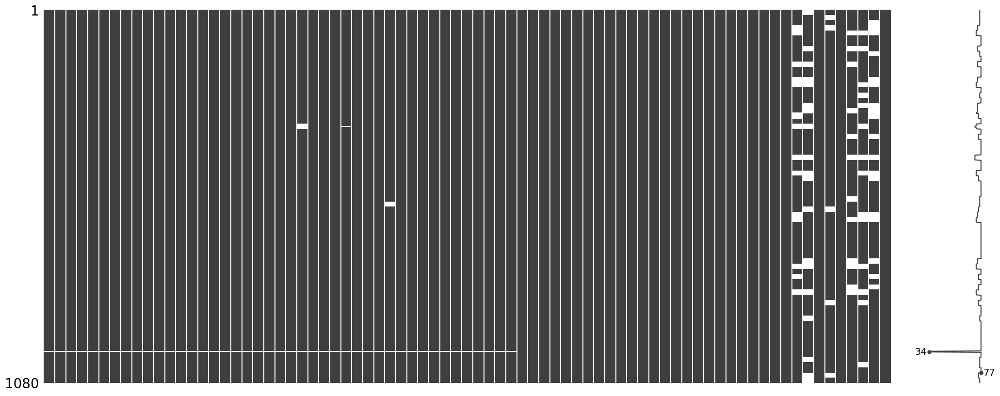

In [11]:
# check for null values with msno
import missingno as msno
msno.matrix(X);

In [14]:
# assume missing data means zero protein and fill in
X = X.fillna(0)
X.isna().sum().sum()

0

## Scale Data
Data must always be scaled prior to performing to PCA.

In [17]:
# instantiate standard scaler
scaler = StandardScaler()

In [19]:
# fit and transform data
scaled_df = scaler.fit_transform(X)

In [22]:
# preview scaled data
scaled_df.head()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
0,0.316184,0.520425,2.150272,1.431211,2.263055,-0.315946,-0.131844,-0.883191,0.588432,0.691053,0.414956,-0.114853,1.563985,0.469129,1.581801,-0.622587,1.133094,1.615542,-0.000258,1.354513,0.178983,0.130485,-0.037378,1.951300,1.830850,1.460002,0.651561,1.048397,0.973123,-0.071405,0.776652,1.810587,-0.609653,0.105458,-0.858943,0.530817,-0.063263,1.234619,0.242389,0.588196,0.435558,0.925540,-0.630876,0.036553,-0.581109,1.626891,-0.455759,0.060645,-0.543186,0.391757,-0.250311,-0.236154,0.507232,-1.066276,-0.762636,-0.185986,-1.236610,-0.423238,0.177590,0.602679,-1.175225,-1.457889,0.221607,-0.866619,-2.137075,-1.119835,-0.182566,-1.305403,-0.060404,-1.552957,-1.066276,-0.336309,-0.285744,-0.318963,-0.194172,-0.256113,1.065901
1,0.360093,0.290904,1.796834,1.358173,1.942924,-0.481966,-0.297651,-0.945663,0.435755,0.363644,0.435484,-0.249502,1.258799,0.145961,1.060877,-0.717164,0.595290,1.070545,0.051116,1.167582,0.105564,-0.110879,-0.225513,1.662893,1.530186,1.348970,0.408145,0.719625,0.708341,-0.365196,0.421471,1.584493,-0.706386,-0.397330,-0.973377,0.037169,-0.366202,0.818406,-0.200678,0.185084,0.124181,0.524539,-0.743679,0.034362,-0.552806,1.741243,-0.462039,0.043512,-0.543596,0.301190,-0.243248,-0.266690,0.279699,-1.046167,-0.398749,-0.120088,-1.104906,-0.200696,0.465222,0.575923,-0.855804,-1.121424,0.497507,-0.907006,-2.074347,-1.322118,0.005344,-0.906725,-0.147972,-1.552957,-1.046167,-0.435610,-0.067645,-0.352708,-0.153290,-0.227103,1.280291
2,0.338349,0.453513,1.922394,1.079490,1.876845,-0.542551,-0.196208,-0.952411,0.530958,0.289373,0.384430,-0.392314,1.167777,0.154066,1.435005,-0.639419,0.616882,1.019159,0.369444,1.013765,0.103179,0.103182,-0.217470,1.675211,1.659751,1.317197,0.515659,0.877523,0.745245,-0.239501,0.301585,1.627966,-0.701353,-0.376560,-0.973191,0.000719,-0.380270,0.570019,-0.115702,0.118453,-0.032702,0.420951,-0.869476,0.112953,-0.503308,2.048102,-0.315190,0.252837,-0.314019,0.227284,-0.167506,-0.562562,0.596537,-0.926271,-0.740008,-0.204246,-1.129764,-0.236554,0.658634,0.591119,-0.205760,-1.197726,0.464494,-0.858927,-2.138655,-1.397250,-0.021831,-1.138611,-0.121187,-1.552957,-0.926271,-0.388586,-0.155059,-0.353796,-0.174775,-0.263576,1.857038
3,0.069943,0.006666,0.776285,0.479556,1.202664,-0.222346,-0.170355,-1.052736,-0.144758,0.360909,0.112440,-0.292161,1.096273,0.819134,0.413265,-1.068375,0.032661,1.254566,0.511304,0.358354,0.037674,0.011191,-0.019345,0.362684,0.755597,0.993615,0.513507,0.176626,0.343159,-0.194868,0.107176,0.760747,-0.698464,-0.316094,-0.915772,-0.077449,-0.350346,0.298343,-0.171073,0.162483,0.239683,0.356614,0.032777,-0.659513,-1.058608,1.189617,-0.162955,0.105658,-1.008513,0.003718,-0.306027,-0.016278,0.319739,-1.285019,-1.050318,-0.702437,-1.265327,-0.260806,0.375563,0.688737,-1.174757,-1.339051,-0.256932,-1.093307,-1.654497,-1.435423,-0.164318,-1.192887,0.088174,-1.552957,-1.285019,-0.264037,-0.818989,-0.131340,-0.000998,-0.071002,1.144490
4,0.041267,0.008063,0.779663,0.204007,0.929002,-0.448046,-0.269370,-1.066737,-0.576374,0.168444,0.019003,-0.471570,0.848187,0.076505,0.329784,-1.132614,-0.274611,1.010366,0.592785,0.056385,-0.045811,-0.126454,-0.184208,0.467895,0.644626,0.756156,0.269220,0.057021,0.090834,-0.445535,-0.079389,0.675489,-0.753112,-0.610134,-1.097823,-0.505371,-0.444624,-0.099839,-0.547966,-0.069328,-0.048254,0.023377,0.000429,-0.713041,-1.012998,1.269871,-0.105144,0.117638,-0.872642,0.026481,

## Visualize Data

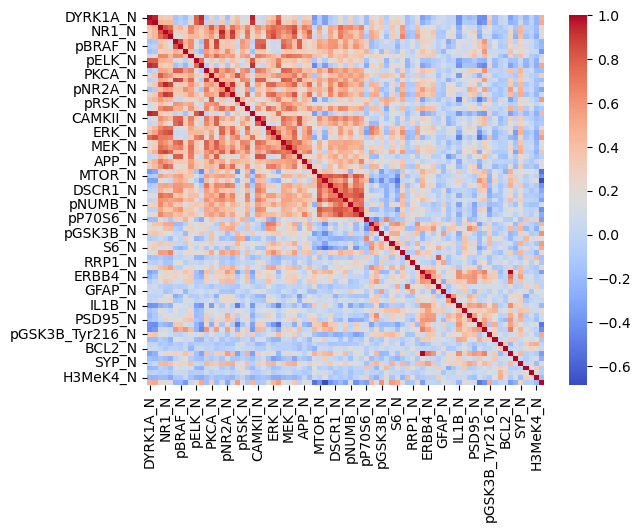

In [25]:
# create heatmap with sns
corr = scaled_df.corr()
sns.heatmap(corr, cmap='coolwarm');

KeyboardInterrupt: 

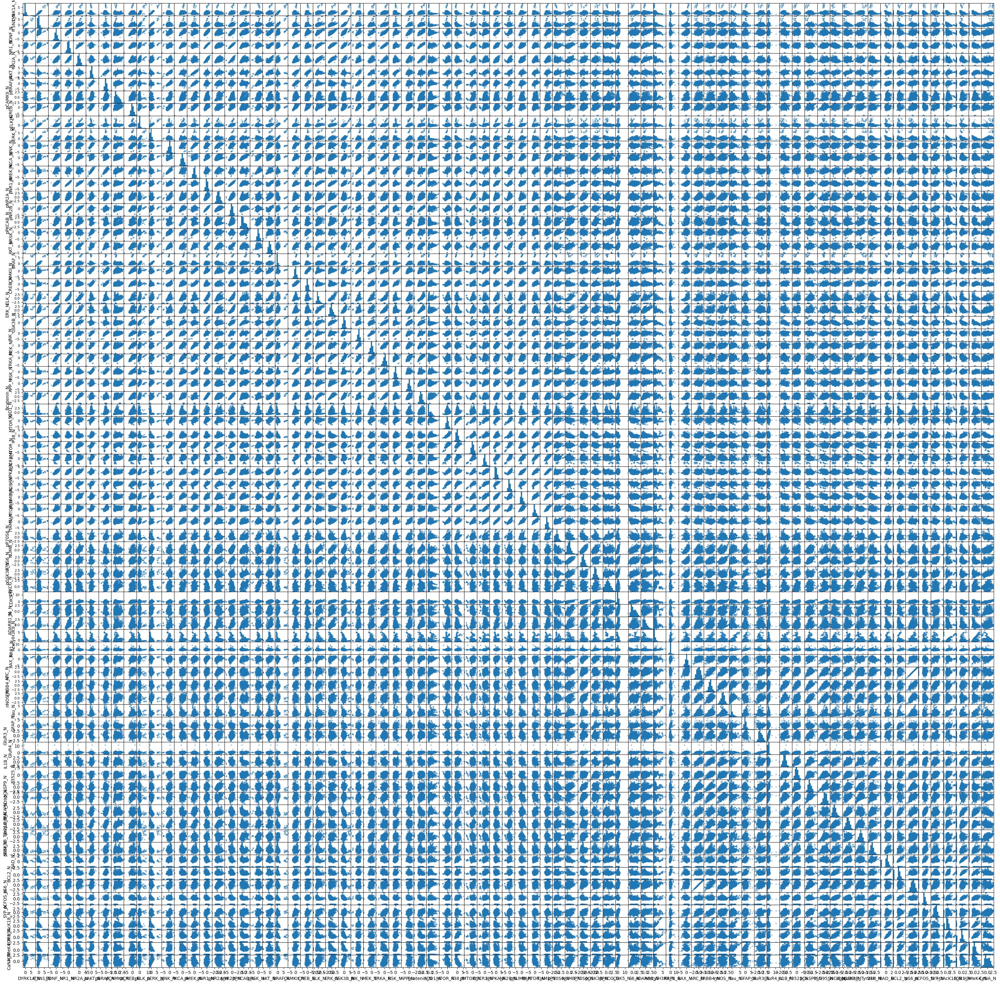

In [26]:
# alternatively can use scatter_matrix which contains lots of info but difficult to see
pd.plotting.scatter_matrix(scaled_df, figsize=(40,40))

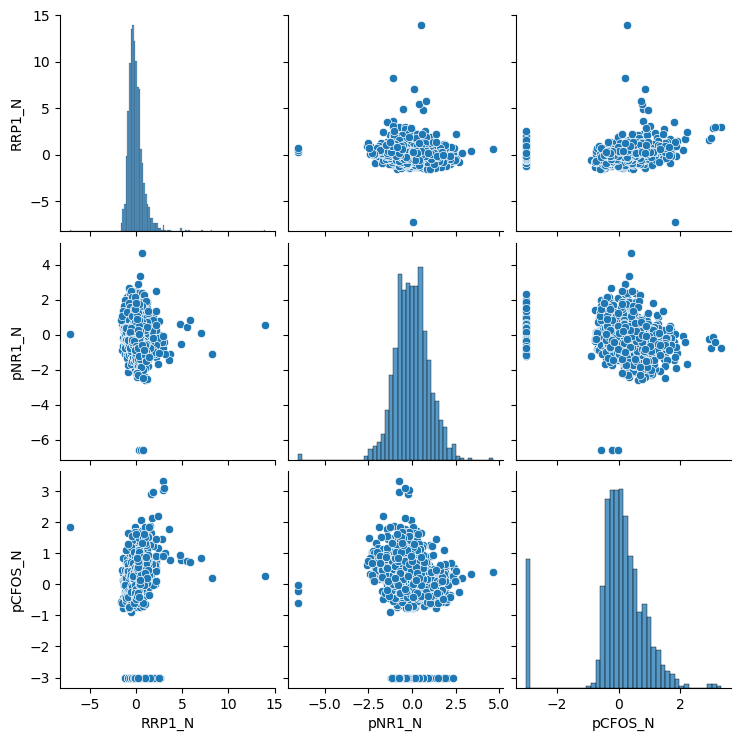

In [27]:
# can also use sns pairplot, but takes forever
# use smaller subset of columns at a time

# randomly select features to plot
np.random.seed(42)
random_features = np.random.choice(scaled_df.columns,3)

# plot randomly selected features
sns.pairplot(scaled_df, vars = random_features);

### visualize target along with features with colored target classes

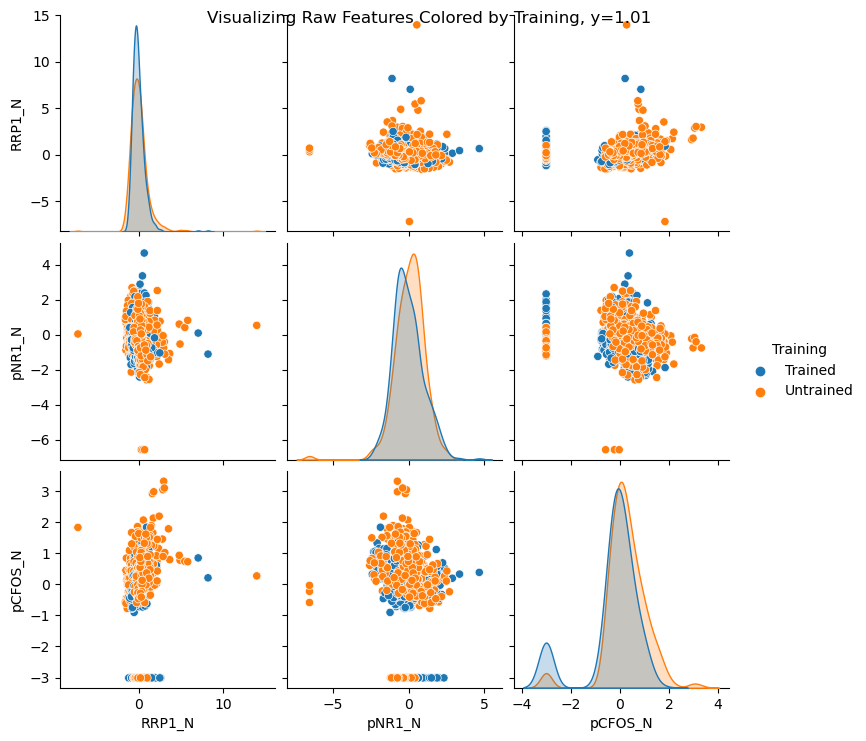

In [29]:
# concatenate scaled features with target
plot_df = pd.concat([scaled_df,df[target]], axis=1)

# plot with color coding based on target
g = sns.pairplot(data=plot_df,vars=random_features,hue='Training')
g.fig.suptitle('Visualizing Raw Features Colored by Training, y=1.01');

## PCA

Use PCA to combine our features into a manageable number of principal components that can be visualized, rather than using only a subset of features.

In [30]:
# instantiate PCA to make 3 principal components
pca = PCA(n_components=3)

In [31]:
# create and define the principal components
principal_components = pca.fit_transform(scaled_df)

In [32]:
# preview data
principal_components.head()

,pca0,pca1,pca2
0,-4.150955,4.895384,-1.697352
1,-2.563560,4.804695,-0.827997
2,-2.653338,5.035138,-0.532218
3,-0.524966,3.552819,-2.643804
4,0.554189,3.672825,-1.477558


In [34]:
# use pca.explained_variance_ratio_ to obtain amount of variance explained by each PC
pca.explained_variance_ratio_

array([0.26455587, 0.14716558, 0.10313688])

In [35]:
# sum 3 PCs for total variance
pca.explained_variance_ratio_.sum()

0.5148583352086863

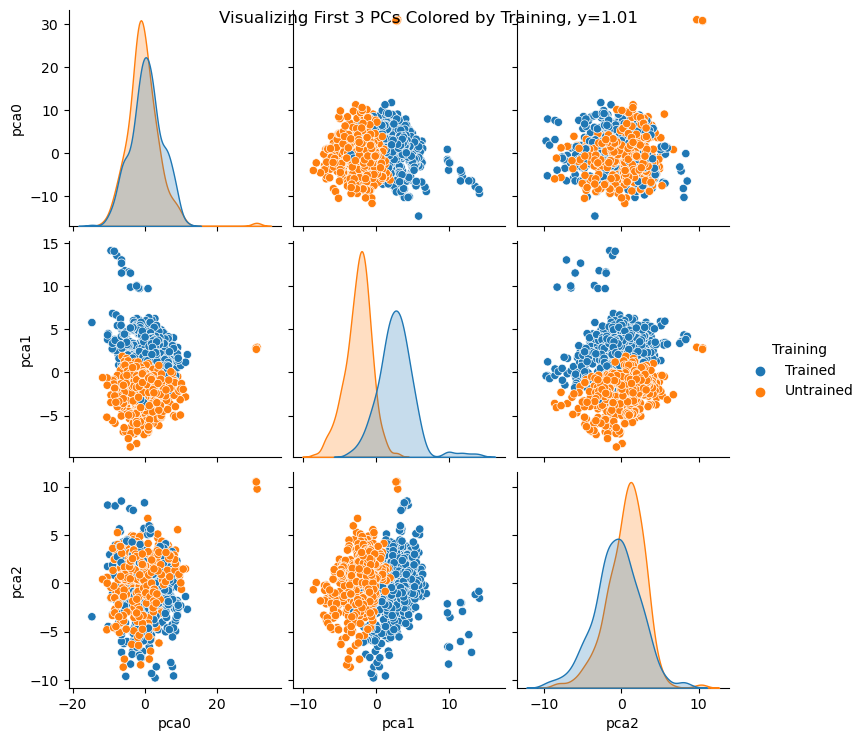

In [36]:
# concatenate PCs with target
plot_df_pca = pd.concat([principal_components, df[target]], axis=1)

# plot with color coding based on target
g_pca = sns.pairplot(data=plot_df_pca,vars=principal_components.columns,hue='Training')
g_pca.fig.suptitle('Visualizing First 3 PCs Colored by Training, y=1.01');

## Graphing 3 Dimensions with Plotly

​Plotly will allow us to create 3D visuals that we zoom in on and rotate.

In [39]:
# import plotly
import plotly.express as px
import plotly.io as pio

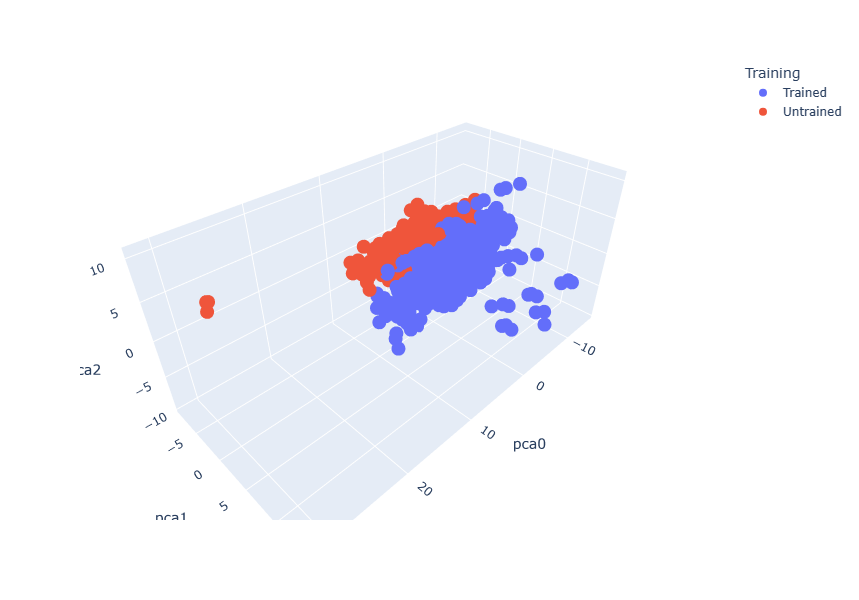

In [40]:
# create 3d scatterplot with a PC on each axis, colored by target
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2',width=800,height=600,color='Training')
fig

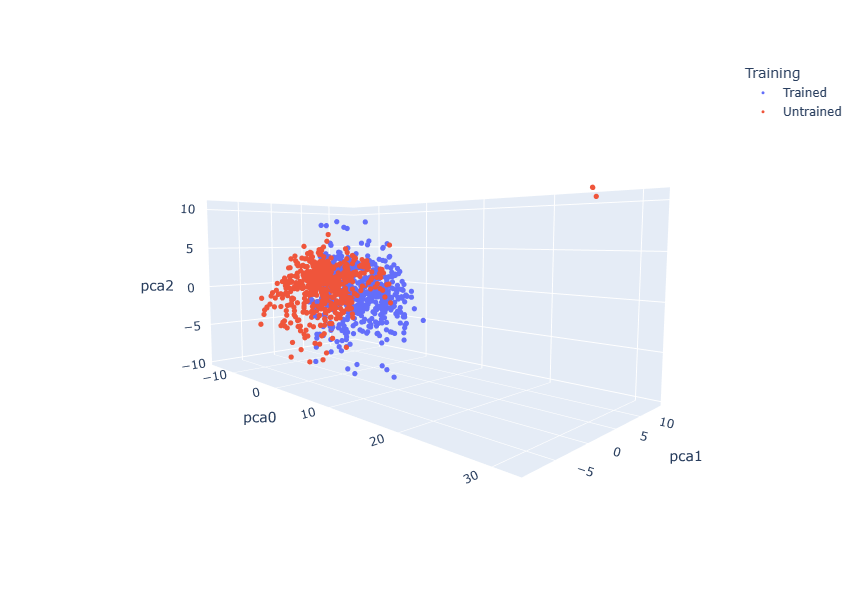

In [43]:
# function to decrease marker size and turning off scrollZoom
def update_scatter3d(fig):
    fig.update_traces({'marker':{'size':3}})
    fig.show(config={'scrollZoom':False})

# run function on above fig
update_scatter3d(fig)

In [44]:
# view available templates to adjust styling of the plot
pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

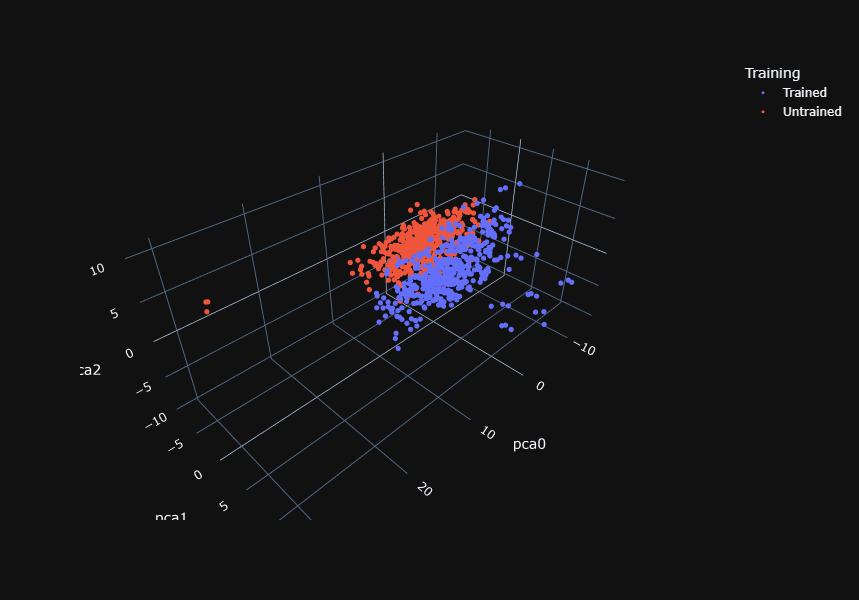

In [51]:
# Make a 3d scatter plot with a PC on each axis and color by the target
# Change template style to plotly_dark
fig = px.scatter_3d(plot_df_pca, x='pca0',y='pca1',z='pca2', width=800, height=600, color = "Training", template = 'plotly_dark')
update_scatter3d(fig)